In [1]:
from ProblemGenerator import ProblemGenerator


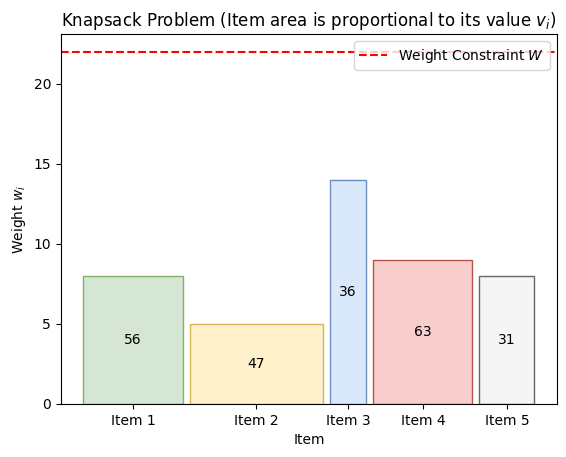

([1, 1, 0, 1, 0], 166.0)


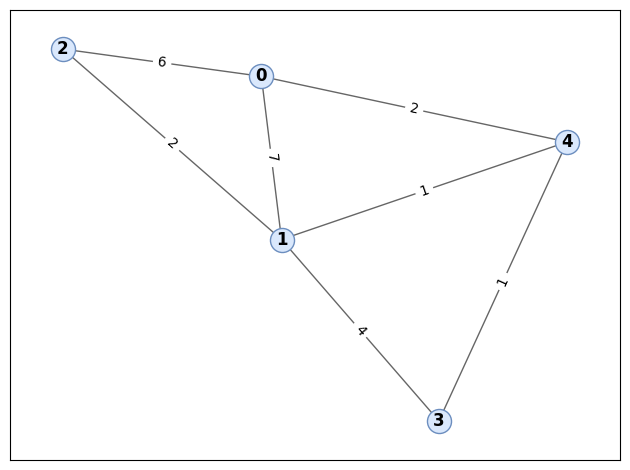

([0, 1, 1, 0, 1], 20.0)


In [2]:
generator = ProblemGenerator()
problem = generator.generate_knapsack(5, (5, 20), (5, 63))
problem.visualize_problem()
# print(problem. qubo)
print(problem.solution)
problem2 = generator.generate_maxcut(5, 7, weights=True)
problem2.visualize_problem()
print(problem2.solution)

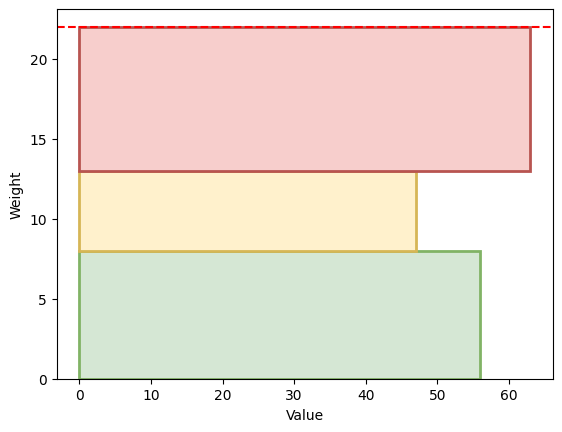

In [3]:
problem.visualize_solution()

[0, 1, 1, 0, 1]


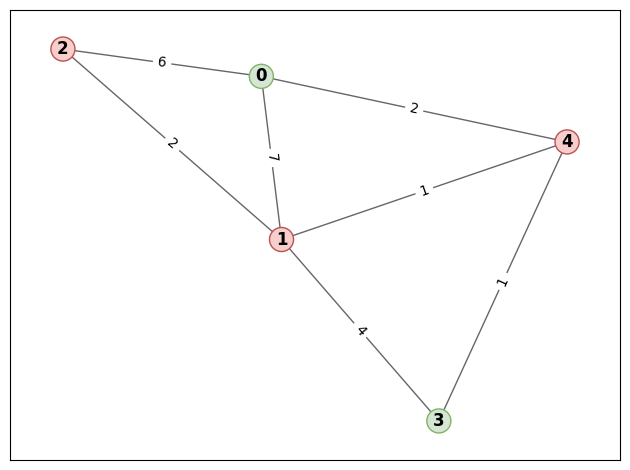

In [4]:
problem2.visualize_solution()

In [5]:
from QuantumOptimizer import QuantumOptimizer
from Backend import *

In [6]:
problem2.to_qaoa_ansatz(p=4)
optimizer = QuantumOptimizer()
optimizer.set_problem(problem2)
backend = StatevectorSimulatorBackend()
# backend = StatevectorEstimator()
optimizer.set_backend(backend)
optimizer.optimize()

([1, 1, 0, 0, 1], -13.0)

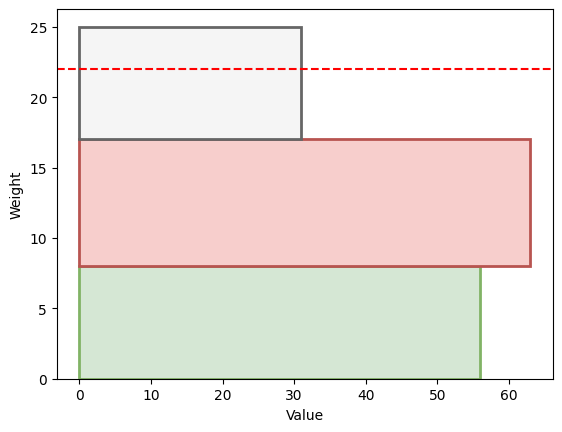

([1, 0, 0, 1, 1, 1, 1, 1, 1, 0], 75666.0)


In [7]:
problem.to_qaoa_ansatz(p=4)
optimizer.set_problem(problem)
optimizer.set_optimizer("BFGS")
solution = optimizer.optimize()
problem.visualize_solution(solution = solution)
print(solution)

[0, 0, 1, 1, 0]


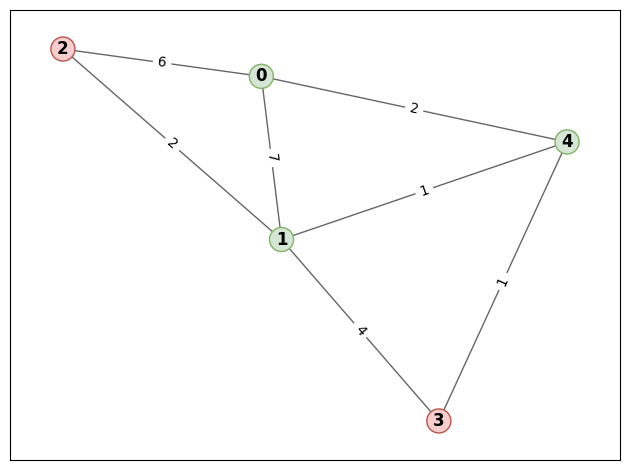

Nelder-Mead: ([0, 0, 1, 1, 0], -13.0)
[1, 0, 1, 1, 0]


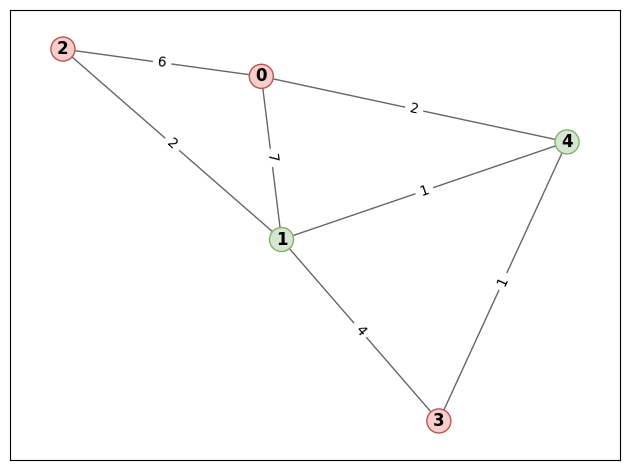

Powell: ([1, 0, 1, 1, 0], -16.0)
[0, 1, 0, 0, 1]


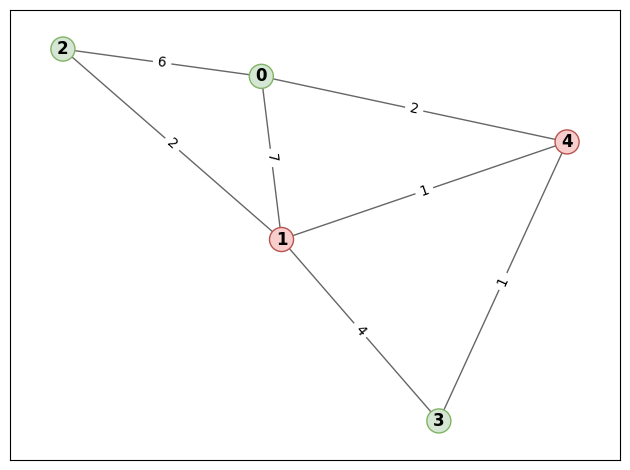

CG: ([0, 1, 0, 0, 1], -16.0)
[0, 0, 1, 1, 0]


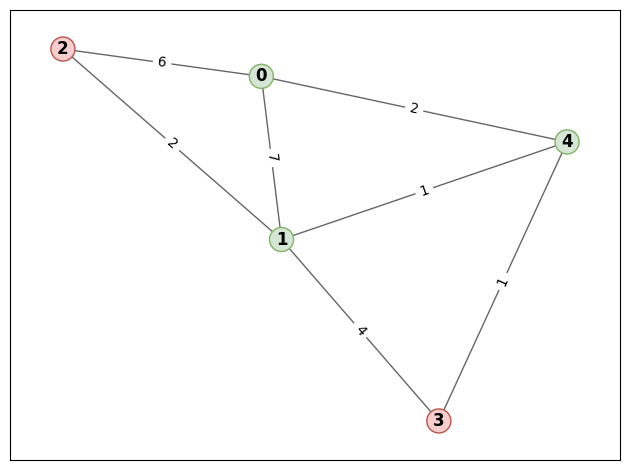

BFGS: ([0, 0, 1, 1, 0], -13.0)
Newton-CG failed
Jacobian is required for Newton-CG method
[1, 0, 1, 1, 0]


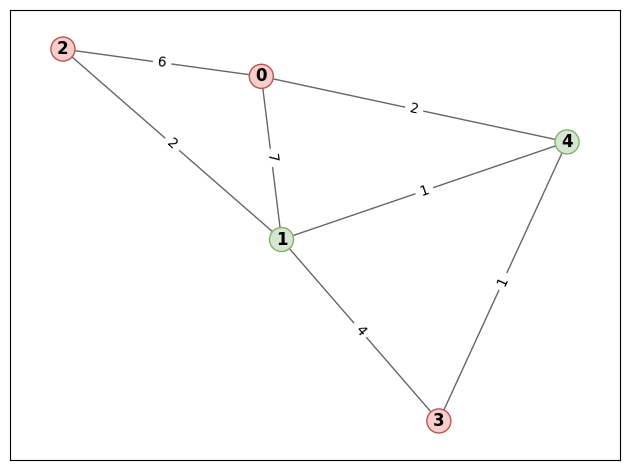

L-BFGS-B: ([1, 0, 1, 1, 0], -16.0)
[0, 1, 0, 0, 1]


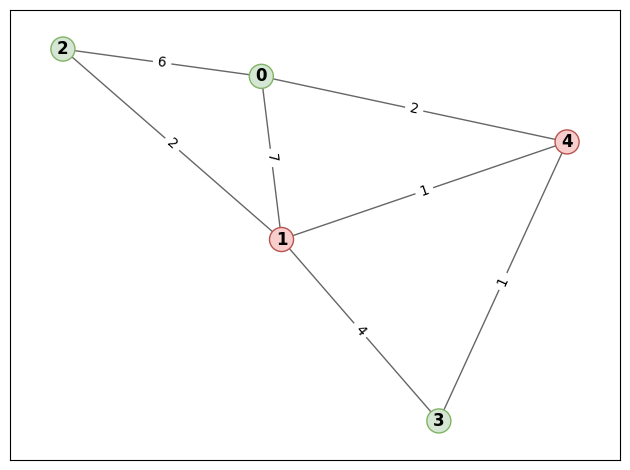

TNC: ([0, 1, 0, 0, 1], -16.0)
[1, 1, 0, 0, 1]


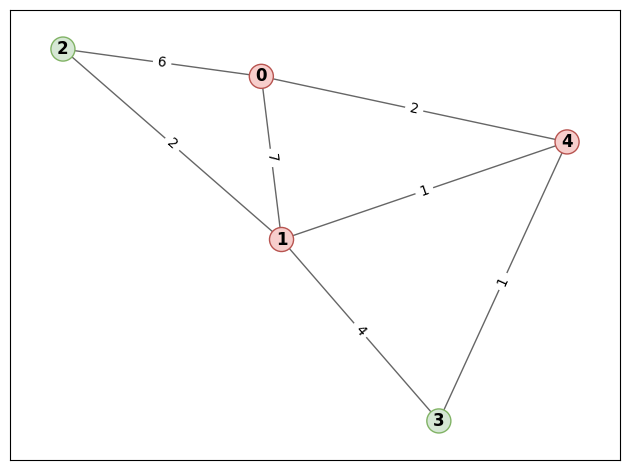

COBYLA: ([1, 1, 0, 0, 1], -13.0)
[0, 1, 1, 0, 1]


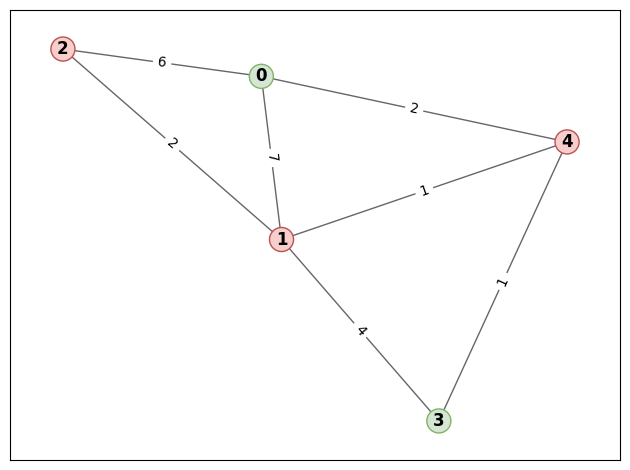

SLSQP: ([0, 1, 1, 0, 1], -20.0)
[1, 0, 1, 0, 1]


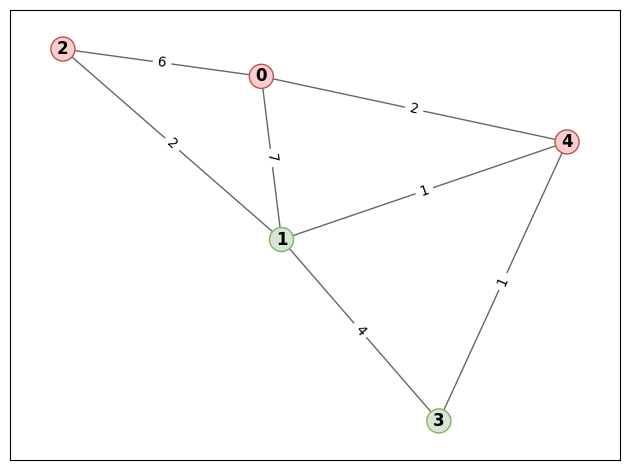

trust-constr: ([1, 0, 1, 0, 1], -11.0)
dogleg failed
Jacobian is required for dogleg minimization
trust-ncg failed
Jacobian is required for Newton-CG trust-region minimization
trust-exact failed
Jacobian is required for trust region exact minimization.
trust-krylov failed
('Jacobian is required for trust region ', 'exact minimization.')


In [8]:
list_of_optimizers = ["Nelder-Mead", "Powell", "CG", "BFGS", "Newton-CG", "L-BFGS-B", "TNC", "COBYLA", "SLSQP", "trust-constr", "dogleg", "trust-ncg", "trust-exact", "trust-krylov"]

problem2.to_qaoa_ansatz(p=4)
optimizer = QuantumOptimizer()
optimizer.set_problem(problem2)
optimizer.set_backend(backend)

for minimizer in list_of_optimizers:
    try:
        optimizer.set_optimizer(minimizer)
        solution = optimizer.optimize()
        problem2.visualize_solution(solution = solution)
        print(f"{minimizer}: {solution}")
    except Exception as e:
        print(f"{minimizer} failed")
        print(e)

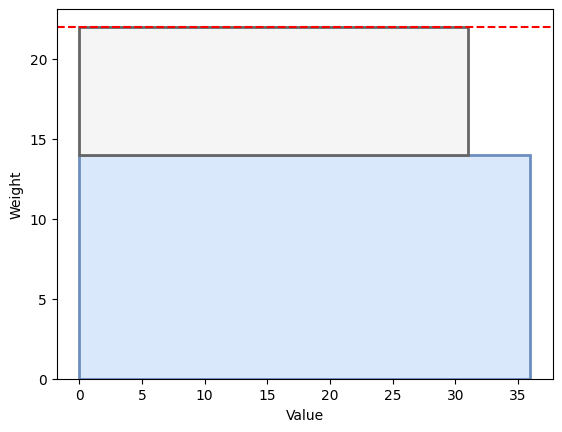

Nelder-Mead: ([0, 0, 1, 0, 1, 1, 0, 0, 1, 0], 18887.0)


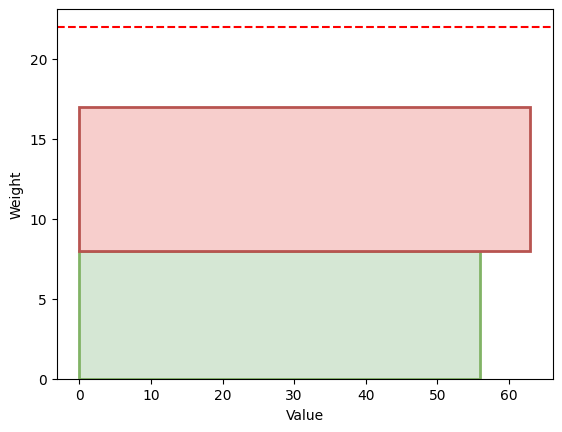

Powell: ([1, 0, 0, 1, 0, 1, 1, 0, 1, 0], 8305.0)


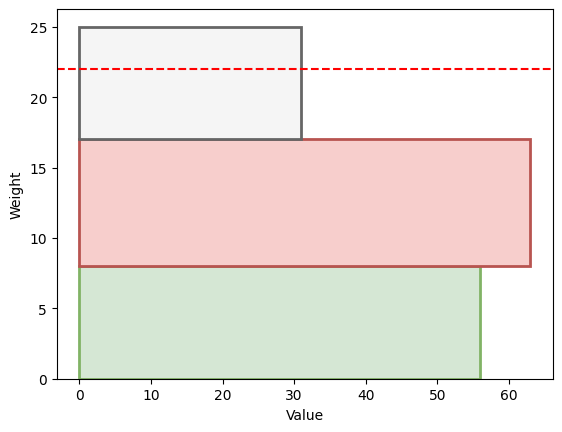

CG: ([1, 0, 0, 1, 1, 1, 0, 1, 0, 0], 14826.0)


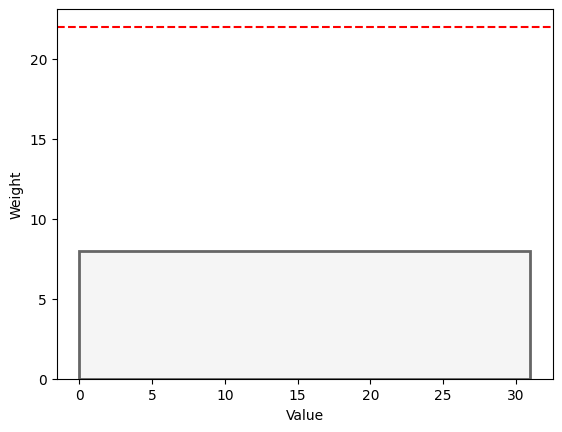

BFGS: ([0, 0, 0, 0, 1, 0, 0, 0, 1, 0], 8393.0)
Newton-CG failed
Jacobian is required for Newton-CG method


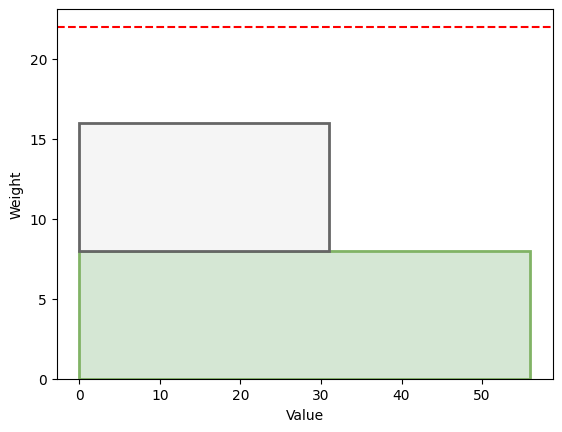

L-BFGS-B: ([1, 0, 0, 0, 1, 0, 1, 0, 1, 0], 3657.0)


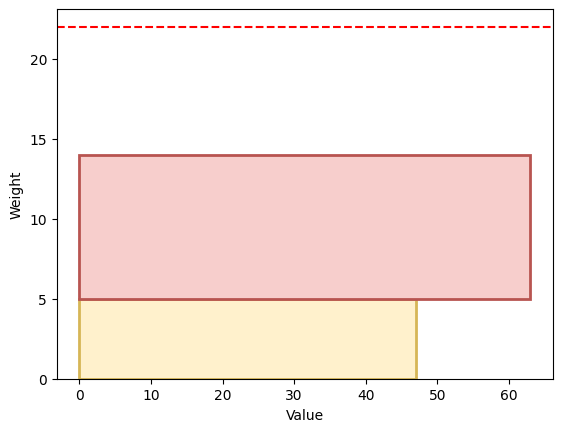

TNC: ([0, 1, 0, 1, 0, 0, 1, 0, 1, 0], 826.0)


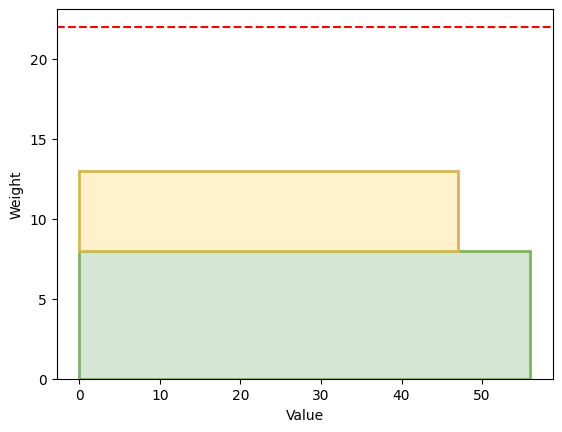

COBYLA: ([1, 1, 0, 0, 0, 1, 0, 0, 1, 0], -103.0)


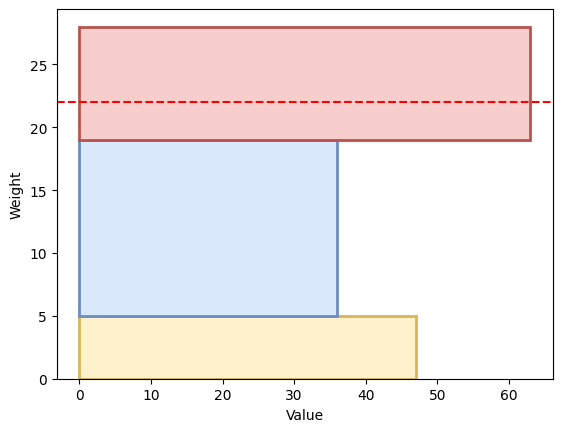

SLSQP: ([0, 1, 1, 1, 0, 0, 0, 1, 0, 0], 23254.0)


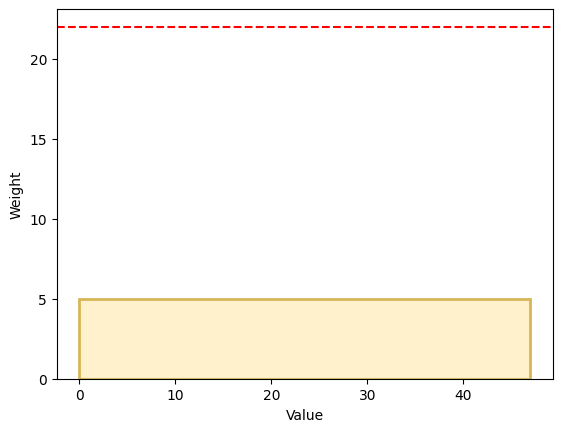

trust-constr: ([0, 1, 0, 0, 0, 0, 1, 1, 1, 1], 3697.0)
dogleg failed
Jacobian is required for dogleg minimization
trust-ncg failed
Jacobian is required for Newton-CG trust-region minimization
trust-exact failed
Jacobian is required for trust region exact minimization.
trust-krylov failed
('Jacobian is required for trust region ', 'exact minimization.')


In [9]:
list_of_optimizers = ["Nelder-Mead", "Powell", "CG", "BFGS", "Newton-CG", "L-BFGS-B", "TNC", "COBYLA", "SLSQP", "trust-constr", "dogleg", "trust-ncg", "trust-exact", "trust-krylov"]

problem.to_qaoa_ansatz(p=4)
optimizer = QuantumOptimizer()
optimizer.set_problem(problem)
optimizer.set_backend(backend)

for minimizer in list_of_optimizers:
    try:
        optimizer.set_optimizer(minimizer)
        solution = optimizer.optimize()
        problem.visualize_solution(solution = solution)
        print(f"{minimizer}: {solution}")
    except Exception as e:
        print(f"{minimizer} failed")
        print(e)

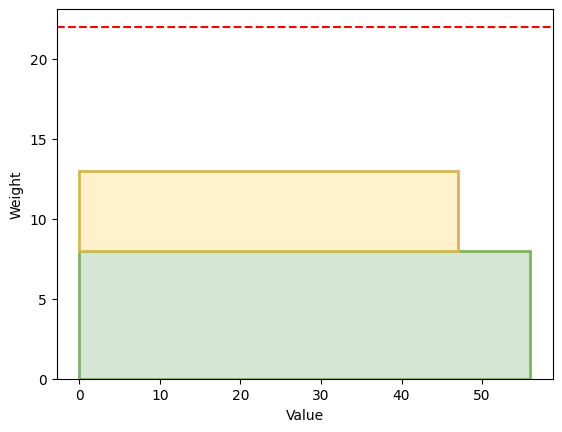

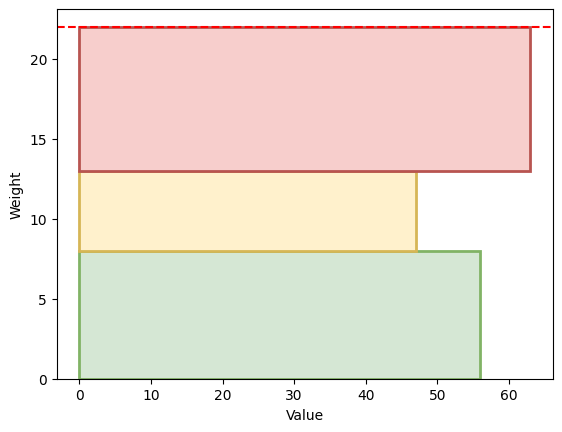

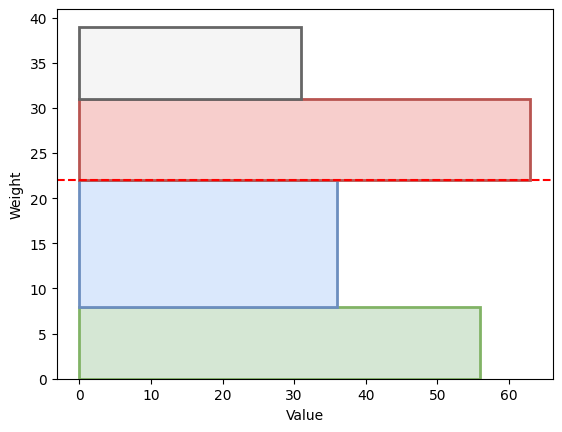

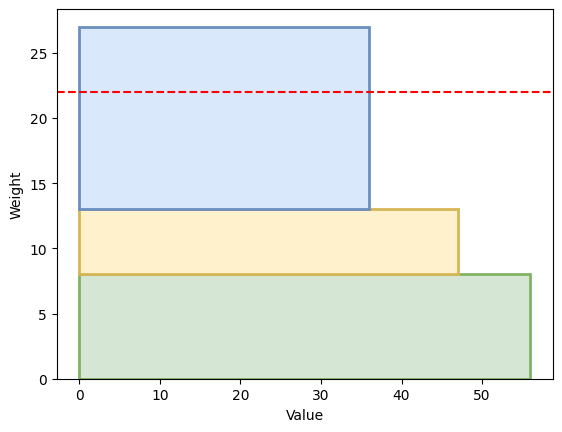

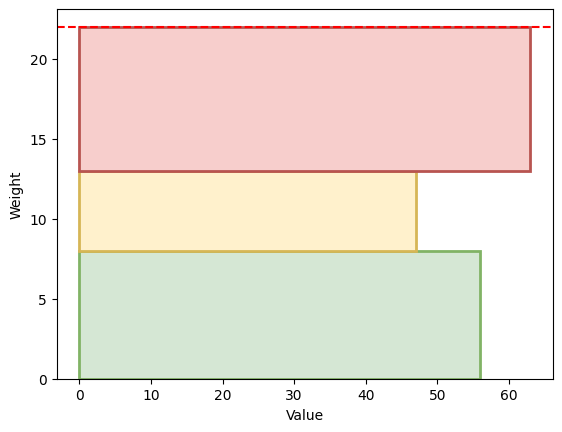

...

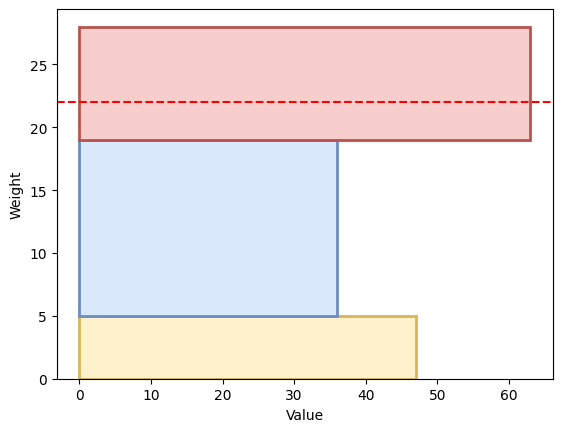

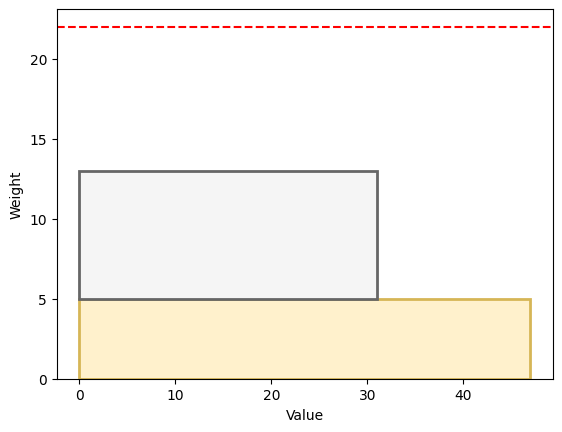

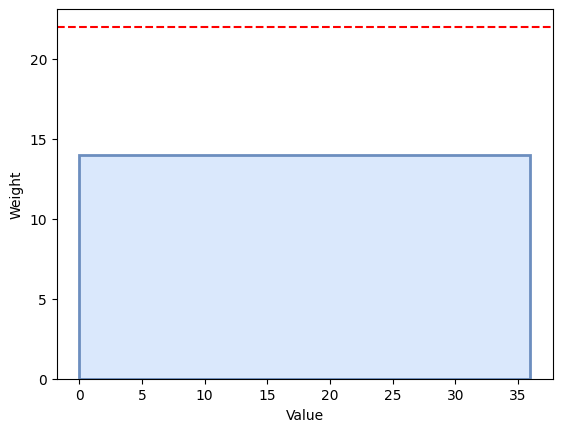

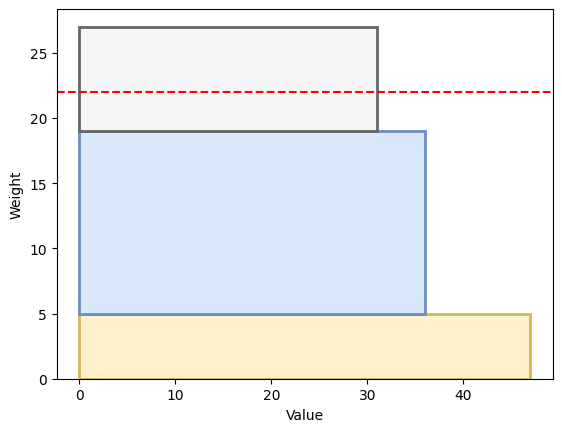

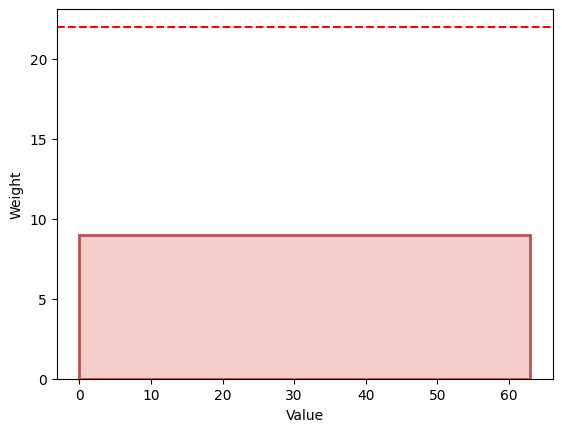

In [10]:
import os
import json
file_name = "solutions.json"

solutions = []
for i in range(1,20):
    problem.to_qaoa_ansatz(p=i)
    print(f"p={i}")
    for j in range(10):
        optimizer.set_problem(problem)
        optimizer.set_optimizer("L-BFGS-B")
        optimizer.set_backend(backend)
        solution = optimizer.optimize()
        print(f"p = {i}, iteration = {j}, solution = {solution}")
        solutions.append(optimizer.to_json())
        # append new solution to file
        with open(file_name, "w") as file:
            json.dump(solutions, file)
